This script generates the plots for the figures S2 to S4 in the supplementary material using a `.pkl` file containing the selected simulation outputs created by the **data_saving.py** script.

In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

Importing libraries

In [2]:
import numpy as np
from matplotlib.ticker import (MultipleLocator,  AutoMinorLocator, ScalarFormatter)
import matplotlib as mlt
import matplotlib.pyplot as plt
plt.rc('axes', linewidth=2)
plt.rcParams['font.size'] = '20'
import joblib as jb
from my_functions import S2, S3, S4, S5, s_transfer, S6, S7
from matplotlib import gridspec
from scipy.interpolate import interp1d

**Now loading the data**

In [3]:
all_data = jb.load('../data/selected_simulations_time_short.pkl')
main_headers = all_data.keys()
#print("Main Headers: Simulations")
#for header in main_headers:
#    print(header)

**ploting S2**

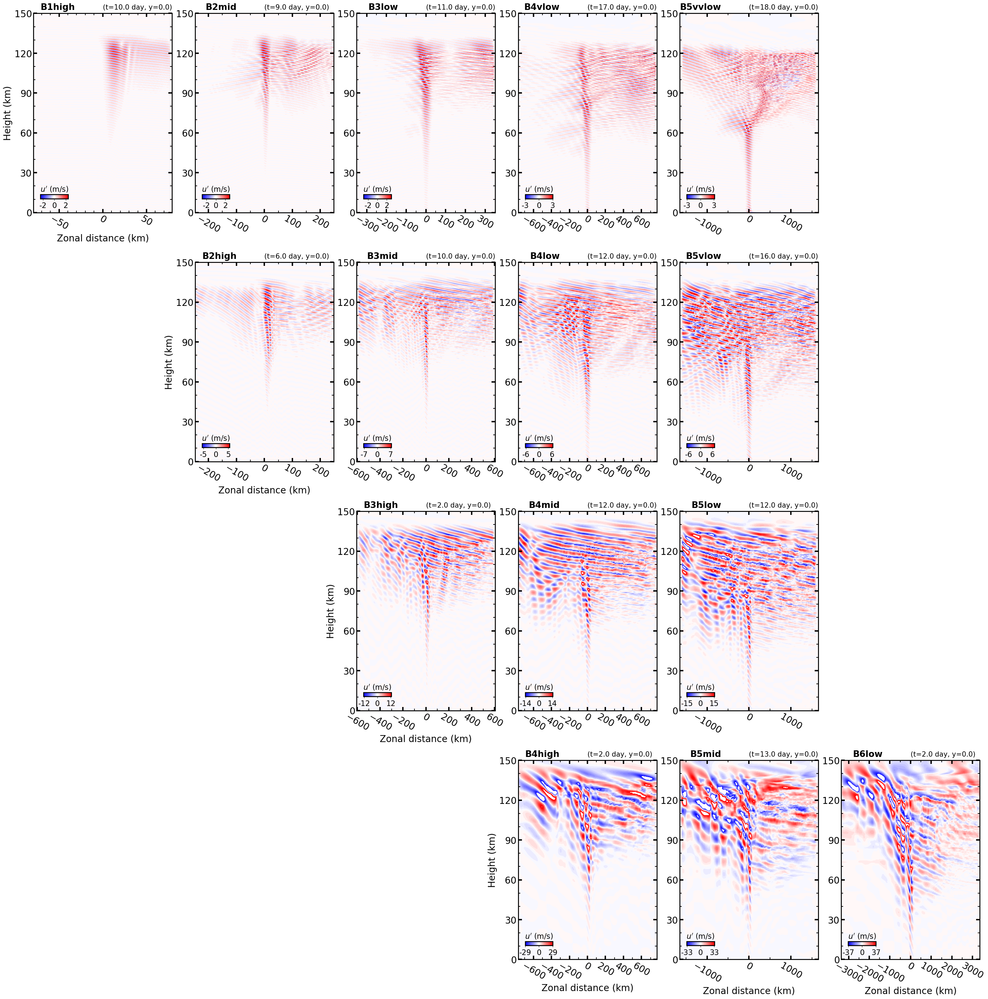

In [4]:
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(30, 30))
for ax in axes.flatten(): # deactivate all subplots' frame
    ax.axis("off")
fig.tight_layout(pad=2.5)  # Reduce overall padding 
fig.subplots_adjust(hspace=0.25)

for iname in (main_headers):
    
#    print(iname)
    data = all_data[iname]
    lon = data['lon']
    time = data['time']
    height = data['height'][:,1]
    u0 = data['u(t,z,0,lon)']
    m_u = data['m_u(t,z)']
      
    tnames = iname[:2]
    tstrength = iname[2:]
    icol = int(iname[1])-1
    i = icol
    if tstrength == 'high':   j = i
    if tstrength == 'mid':    j = i - 1
    if tstrength == 'low':    j = i - 2
    if tstrength == 'vlow':   j = i - 3
    if tstrength == 'vvlow':  j = i - 4

    ax = axes[j, i]
    ax.axis("on")  # Activate the frame
    S2(lon, time, height, u0, m_u, fig, ax, iname)

    # Set labels based on row and column positions
    if i == j:        
        ax.set(xlabel='Zonal distance (km)', ylabel='Height (km)')
    elif j == 3:
        ax.set(xlabel='Zonal distance (km)')
  
plt.show()   

**Figure S3**

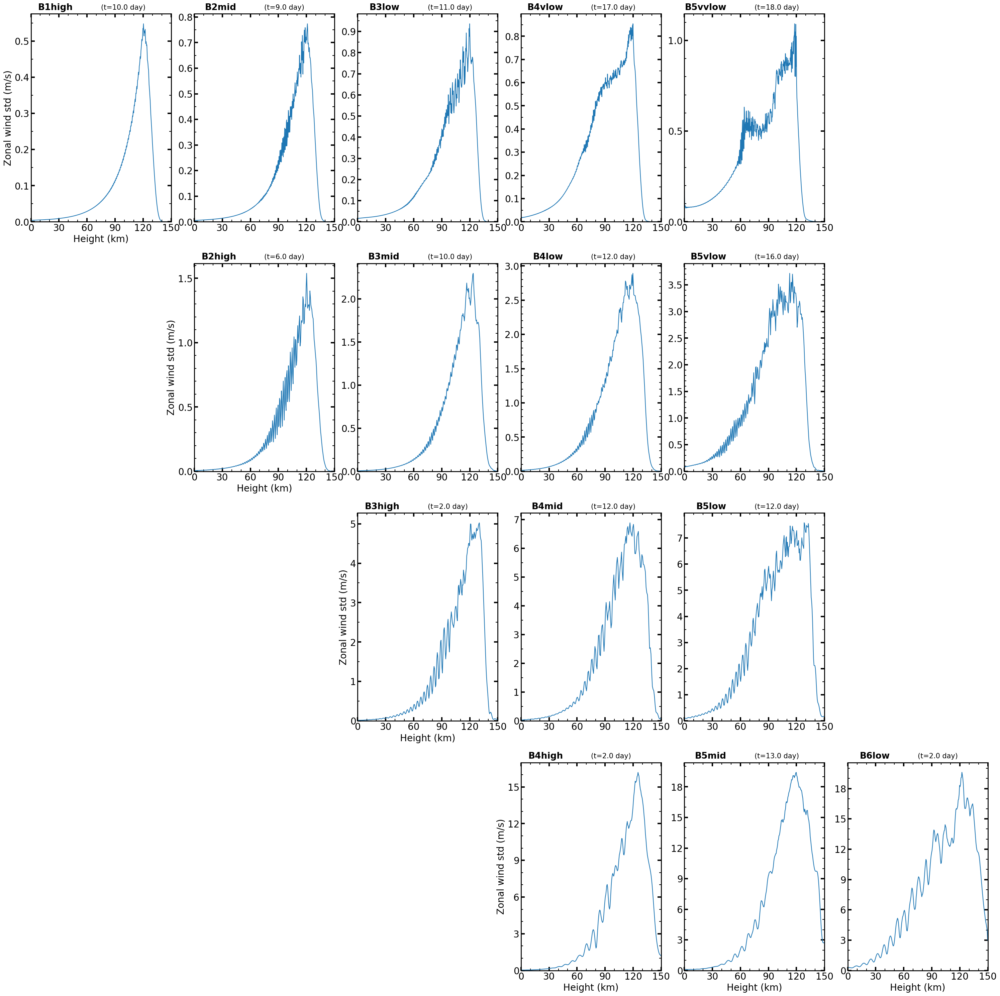

In [5]:
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(30, 30))
for ax in axes.flatten(): # deactivate all subplots' frame
    ax.axis("off")
fig.tight_layout(pad=2.5)  # Reduce overall padding 
fig.subplots_adjust(hspace=0.2)

for iname in (main_headers):
    
#    print(iname)
    data = all_data[iname]
    time = data['time']
    height = data['height'][:,1]
    std_u = data['std_up(z)']
    
    tnames = iname[:2]
    tstrength = iname[2:]
    icol = int(iname[1])-1
    i = icol
    if tstrength == 'high':   j = i
    if tstrength == 'mid':    j = i - 1
    if tstrength == 'low':    j = i - 2
    if tstrength == 'vlow':   j = i - 3
    if tstrength == 'vvlow':  j = i - 4

    ax = axes[j, i]
    ax.axis("on")  # Activate the frame
    S3(time,height,std_u.data,ax,iname)

    # Set labels based on row and column positions
    if i == j:        
        ax.set(ylabel='Zonal wind std (m/s)', xlabel='Height (km)')
    elif j == 3:
        ax.set(xlabel='Height (km)')
    
 

**Figure S4**

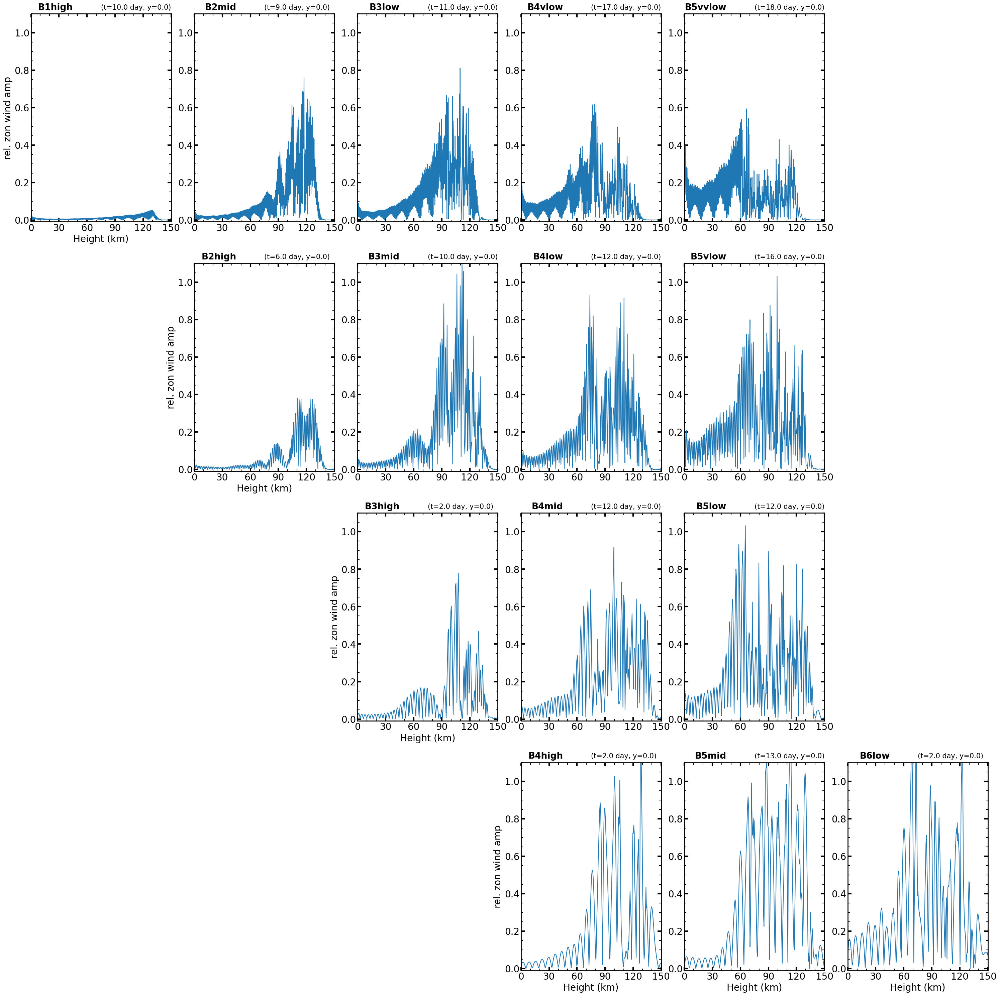

In [6]:
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(30, 30))
for ax in axes.flatten(): # deactivate all subplots' frame
    ax.axis("off")
fig.tight_layout(pad=2.5)  # Reduce overall padding 
fig.subplots_adjust(hspace=0.2)

for iname in (main_headers):
    
#    print(iname)
    data = all_data[iname]
    lon_m = int(len(data['lon'])/2)+1
    time = data['time']
    height = data['height'][:,1]
    m_u = data['m_u(t,z)']
    u0 = data['u(t,z,0,lon)'][:,lon_m]
    
    tnames = iname[:2]
    tstrength = iname[2:]
    icol = int(iname[1])-1
    i = icol
    if tstrength == 'high':   j = i
    if tstrength == 'mid':    j = i - 1
    if tstrength == 'low':    j = i - 2
    if tstrength == 'vlow':   j = i - 3
    if tstrength == 'vvlow':  j = i - 4

    ax = axes[j, i]
    ax.axis("on")  # Activate the frame
    S4(lon, time, height, u0, m_u, ax, iname)

    # Set labels based on row and column positions
    if i == j:        
        ax.set(ylabel='rel. zon wind amp', xlabel='Height (km)')
    elif j == 3:
        ax.set(xlabel='Height (km)')



**ploting S5**

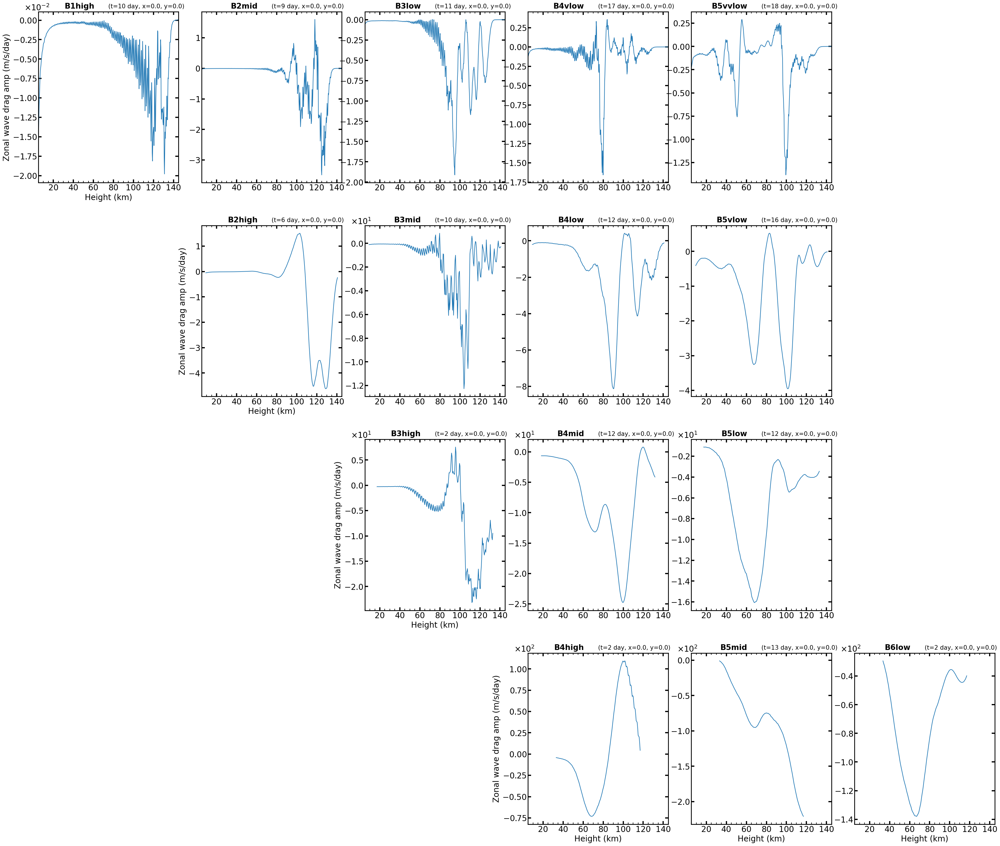

In [7]:
all_data5 = jb.load('../data/FigS5.pkl')
main_headers = all_data5.keys()


fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(35, 30))
for ax in axes.flatten(): # deactivate all subplots' frame
    ax.axis("off")
fig.tight_layout(pad=2.9)  # Reduce overall padding 
fig.subplots_adjust(hspace=0.25)

for iname in (main_headers):
    data = all_data5[iname]
    time = data['time']
    height = data['height']
    a_x = data['a_x']

    
    tnames = iname[:2]
    tstrength = iname[2:]
    icol = int(iname[1])-1
    i = icol
    if tstrength == 'high':   j = i
    if tstrength == 'mid':    j = i - 1
    if tstrength == 'low':    j = i - 2
    if tstrength == 'vlow':   j = i - 3
    if tstrength == 'vvlow':  j = i - 4

    ax = axes[j, i]
    ax.axis("on")  # Activate the frame

    S5(time, height, a_x, ax, iname)
    # Set labels based on row and column positions
    if i == j:        
        ax.set(ylabel='Zonal wave drag amp (m/s/day)', xlabel='Height (km)')
    elif j == 3:
        ax.set(xlabel='Height (km)')


**ploting S6**

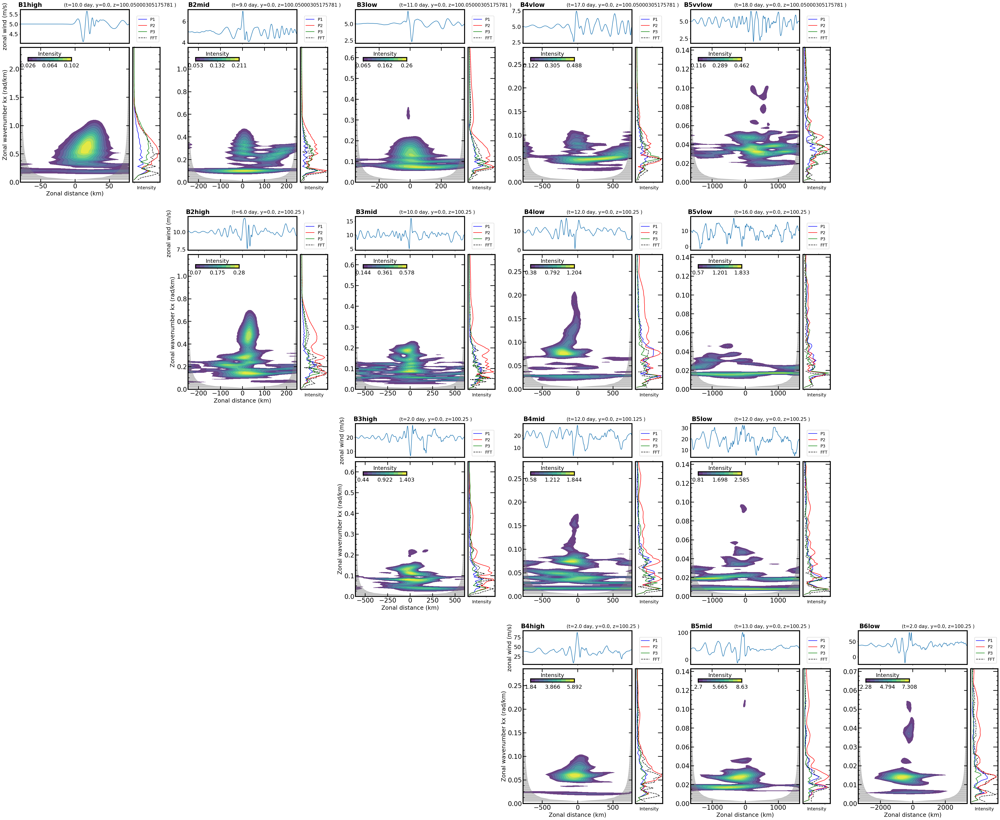

In [8]:
rows, cols = 4, 6
fig = plt.figure(figsize=(55, 45))  # Adjust aspect ratio

fig.tight_layout(pad=2.5)  # Use tight_layout to handle spacing automatically

for iname in (main_headers):
    data = all_data[iname]
    lon = data['lon']
    time = data['time']
    height = data['height'][:, 1]
    u0 = data['u(t,z,0,lon)']
    index100 = np.argmin(np.abs(height - 100.0))
    uu = u0[index100, :]
    dx = abs(lon[0] - lon[1]) * 110

    power, spectrum, freq = s_transfer(uu, dx)
    powerd = power[0:len(freq), :]  
    
    tnames = iname[:2]
    tstrength = iname[2:]
    icol = int(iname[1]) - 1
    i = icol
    if tstrength == 'high':   j = i
    if tstrength == 'mid':    j = i - 1
    if tstrength == 'low':    j = i - 2
    if tstrength == 'vlow':   j = i - 3
    if tstrength == 'vvlow':  j = i - 4

    spec = gridspec.GridSpecFromSubplotSpec(
        nrows=2, ncols=2,
        subplot_spec=plt.GridSpec(rows, cols)[j, i],
        width_ratios=[4, 1], height_ratios=[1, 4],
        wspace=0.05, hspace=0.05
    )
   
    axs, axu = S6(fig, spec, lon, time, height[index100], uu, powerd, spectrum, freq, iname)

    if i == j:        
        axs.set(xlabel='Zonal distance (km)', ylabel='Zonal wavenumber kx (rad/km)')
        axu.set_ylabel('zonal wind (m/s)')
    elif j == 3:
        axs.set(xlabel='Zonal distance (km)')

plt.show()

**plotting S7**

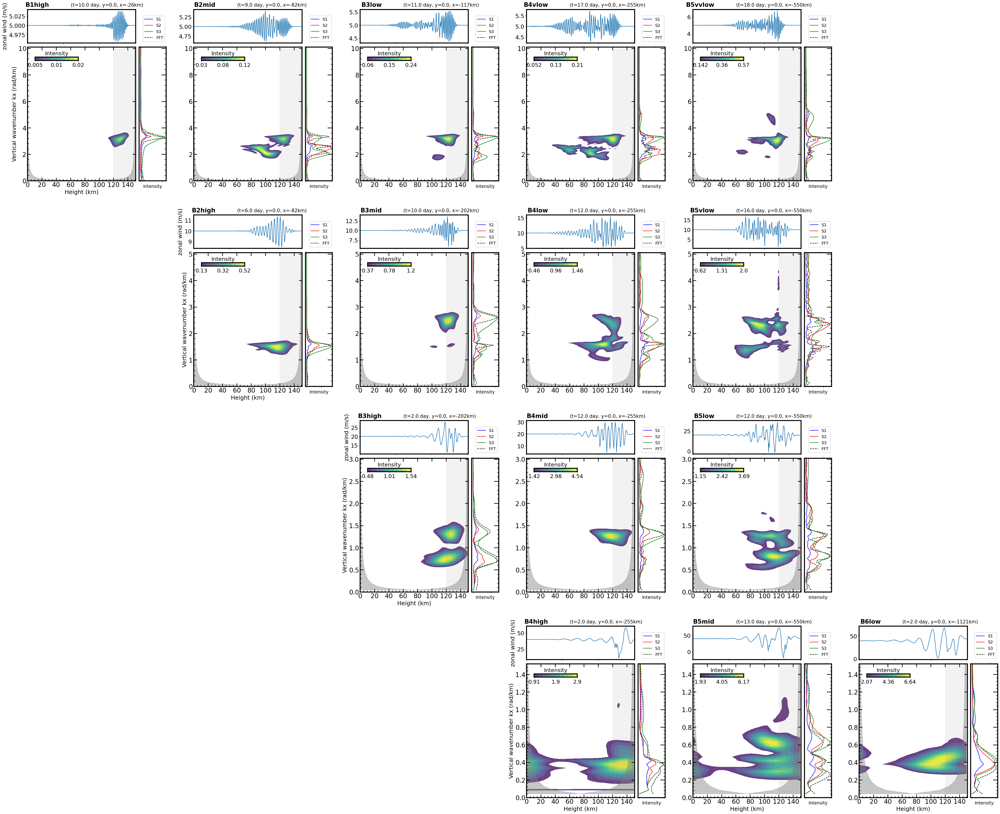

In [9]:
rows, cols = 4, 6
fig = plt.figure(figsize=(55, 45))  # Adjust aspect ratio

fig.tight_layout(pad=2.5)  # Use tight_layout to handle spacing automatically

for iname in (main_headers):
    data = all_data[iname]
    lon = data['lon']
    time = data['time']
    height = data['height'][:, 1]
    u0 = data['u(t,z,0,lon)']
    index_l = int(len(lon)/3)
    uu = u0[:, index_l]
    dz = abs(height[0] - height[1]) 

    power, spectrum, freq = s_transfer(uu, dz)
    powerd = power[0:len(freq), :]  
    
    tnames = iname[:2]
    tstrength = iname[2:]
    icol = int(iname[1]) - 1
    i = icol
    if tstrength == 'high':   j = i
    if tstrength == 'mid':    j = i - 1
    if tstrength == 'low':    j = i - 2
    if tstrength == 'vlow':   j = i - 3
    if tstrength == 'vvlow':  j = i - 4

    spec = gridspec.GridSpecFromSubplotSpec(
        nrows=2, ncols=2,
        subplot_spec=plt.GridSpec(rows, cols)[j, i],
        width_ratios=[4, 1], height_ratios=[1, 4],
        wspace=0.05, hspace=0.05
    )

    x = int(lon[index_l]*110)# zonal distance (km)
    # print(iname,len(height),len(uu))
    axs, axu = S7(fig, spec, height, time, x, uu, powerd, spectrum, freq, iname)

    if i == j:        
        axs.set(xlabel='Height (km)', ylabel='Vertical wavenumber kx (rad/km)')
        axu.set_ylabel('zonal wind (m/s)')
    elif j == 3:
        axs.set(xlabel='Height (km)')

plt.show()


**plotting S8**

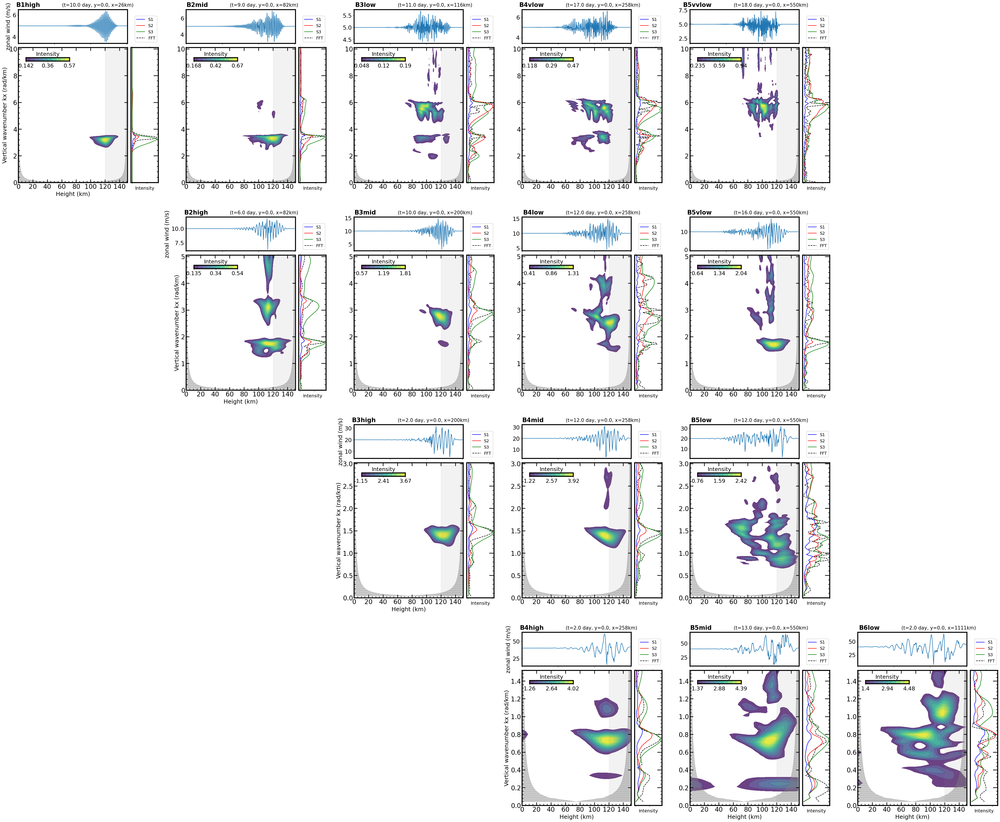

In [10]:
rows, cols = 4, 6
fig = plt.figure(figsize=(55, 45))  # Adjust aspect ratio

fig.tight_layout(pad=2.5)  # Use tight_layout to handle spacing automatically

for iname in (main_headers):
    data = all_data[iname]
    lon = data['lon']
    time = data['time']
    height = data['height'][:, 1]
    u0 = data['u(t,z,0,lon)']
    index_l = 2*int(len(lon)/3)
    uu = u0[:, index_l]
    dz = abs(height[0] - height[1]) 

    power, spectrum, freq = s_transfer(uu, dz)
    powerd = power[0:len(freq), :]  
    
    tnames = iname[:2]
    tstrength = iname[2:]
    icol = int(iname[1]) - 1
    i = icol
    if tstrength == 'high':   j = i
    if tstrength == 'mid':    j = i - 1
    if tstrength == 'low':    j = i - 2
    if tstrength == 'vlow':   j = i - 3
    if tstrength == 'vvlow':  j = i - 4

    spec = gridspec.GridSpecFromSubplotSpec(
        nrows=2, ncols=2,
        subplot_spec=plt.GridSpec(rows, cols)[j, i],
        width_ratios=[4, 1], height_ratios=[1, 4],
        wspace=0.05, hspace=0.05
    )

    x = int(lon[index_l]*110)# zonal distance (km)
    # print(iname,len(height),len(uu))
    axs, axu = S7(fig, spec, height, time, x, uu, powerd, spectrum, freq, iname)

    if i == j:        
        axs.set(xlabel='Height (km)', ylabel='Vertical wavenumber kx (rad/km)')
        axu.set_ylabel('zonal wind (m/s)')
    elif j == 3:
        axs.set(xlabel='Height (km)')

plt.show()